# Memoria del Proyecto
# Análisis Exploratorio de Datos Meteorológicos en Euskal Herria (1940–2024)

---

| | |
|---|---|
| **Proyecto** | EDA Weather Change in Basque Country |
| **Fuente de datos** | API Open-Meteo · Reanálisis ERA5 (ECMWF) |
| **Período analizado** | 1940 – 2024 (85 años) |
| **Ciudades** | Bilbo, Donostia, Vitoria-Gasteiz, Iruñea, Baiona, Arrasate, Maule |
| **Herramientas** | Python · Pandas · Matplotlib · NumPy |

---

## 1. Introducción y contexto

El cambio climático representa uno de los mayores desafíos ambientales de nuestro tiempo. El aumento progresivo de las temperaturas globales, la alteración de los patrones de precipitación y la mayor frecuencia de eventos meteorológicos extremos son fenómenos que ya están afectando de forma tangible a distintas regiones del planeta.

El País Vasco / Euskal Herria, situado en el extremo oriental del Cantábrico y atravesado por los Pirineos occidentales, presenta un clima **atlántico-oceánico** caracterizado por temperaturas suaves, precipitaciones abundantes y una marcada variabilidad estacional. Esta singularidad geográfica lo convierte en un territorio especialmente sensible a las transformaciones climáticas, ya que cualquier desplazamiento en los patrones atmosféricos dominantes puede tener consecuencias directas sobre su ecosistema, recursos hídricos y actividad humana.

El presente análisis exploratorio de datos (EDA) tiene como objetivo estudiar la **evolución meteorológica de las principales ciudades de Euskal Herria** a lo largo del período **1940–2024**, utilizando datos de reanálisis ERA5 proporcionados por la API Open-Meteo.

### Objetivos del análisis

- Detectar tendencias de largo plazo en temperatura y precipitación.
- Identificar diferencias climáticas entre ciudades costeras e interiores.
- Cuantificar el aumento de episodios de calor extremo.
- Evaluar cambios en la estacionalidad a lo largo de las décadas.

## 2. Hipótesis de partida

| ID | Hipótesis | Variable principal |
|---|---|---|
| **H1** | Las temperaturas han experimentado un incremento significativo, más pronunciado desde 1980. | `temperature_2m_max` |
| **H2** | La precipitación acumulada anual muestra tendencia decreciente, con mayor frecuencia de episodios intensos. | `precipitation_sum` |
| **H3** | Las ciudades del interior presentan mayor variabilidad térmica y calentamiento más intenso que las costeras. | `temperature_2m_mean` por ciudad |
| **H4** | El número de días con temperatura máxima > 35 °C ha aumentado desde los 2000, mientras los días bajo cero han disminuido. | `temperature_2m_max` |
| **H5** | Los veranos se han vuelto más cálidos y los inviernos más suaves, incrementando la amplitud estacional. | Amplitud térmica julio–enero |

## 3. Descripción del dataset

### 3.1 Origen de los datos

Los datos han sido obtenidos a través de la **API pública Open-Meteo**, concretamente del conjunto de datos de reanálisis **ERA5** del ECMWF. ERA5 combina modelos numéricos atmosféricos con observaciones históricas para generar series temporales consistentes y sin huecos, siendo una fuente ampliamente utilizada en climatología e investigación ambiental.

La recopilación se realizó mediante el script `descargar_datos.py`, que automatiza las consultas a la API y almacena los resultados en archivos CSV independientes por ciudad.

### 3.2 Cobertura temporal y geográfica

- **Período:** 1940 – 2024 · **Granularidad:** diaria, agregada a mensual/anual para el análisis

| Ciudad | Archivo CSV | Tipo |
|---|---|---|
| Donostia-San Sebastián | `clima_donostia.csv` | Costera |
| Bilbo / Bilbao | `clima_bilbao.csv` | Costera |
| Bayona / Baiona | `clima_baiona.csv` | Costera |
| Pamplona / Iruñea | `clima_irunea.csv` | Interior |
| Vitoria-Gasteiz | `clima_vitoria.csv` | Interior |
| Arrasate / Mondragón | `clima_arrasate.csv` | Interior |
| Maule / Mauléon | `clima_maule.csv` | Interior |

### 3.3 Variables disponibles

| Variable | Descripción |
|---|---|
| `date` | Fecha de la observación |
| `ciudad` | Nombre de la ciudad |
| `año` / `mes` | Campos derivados para agrupación |
| `temperature_2m_mean` | Temperatura media diaria a 2 m (°C) |
| `temperature_2m_max` | Temperatura máxima diaria a 2 m (°C) |
| `temperature_2m_min` | Temperatura mínima diaria a 2 m (°C) |
| `precipitation_sum` | Precipitación acumulada diaria (mm) |

### 3.4 Estructura del proyecto

```
EDA-Weather-Change-in-Basque-Country/
├── data/                        # CSVs por ciudad
├── img/                         # Gráficos generados
│   ├── comp_temp_anual_ciudades/
│   ├── extremos_35/
│   └── temp_30/
├── utils/
│   ├── variables.py             # Listas de rutas y DataFrames compartidos
│   └── funciones.py             # Función cargar_datos()
├── Intro.ipynb
├── Analisis_Csv.ipynb
├── H1_Aumento_temperaturas.ipynb
├── H3_Diferencias_ciudades.ipynb
├── H4_Frecuencia_temp_extremas.ipynb
├── H5_Estacionalidad_marcada.ipynb
└── Memoria.ipynb
```

## 4. Análisis por hipótesis

### H1 — Aumento sostenido de las temperaturas

**Hipótesis:** Las temperaturas medias, mínimas y máximas han aumentado de forma significativa en el período 1940–2024, con mayor intensidad desde 1980.

#### Metodología

Para cada ciudad se contabilizó el número de días por año con temperatura máxima superior a **30 °C**, como indicador del calentamiento progresivo. Se aplicó una **media móvil de 10 años** para revelar la tendencia de fondo eliminando la variabilidad interanual.

Código de colores de las barras:
- 🟢 Verde (`≤ 8 días`): frecuencia baja
- 🟡 Ámbar (`9–13 días`): frecuencia moderada
- 🔴 Rojo (`≥ 14 días`): frecuencia alta, propia de años recientes

#### Observaciones por ciudad

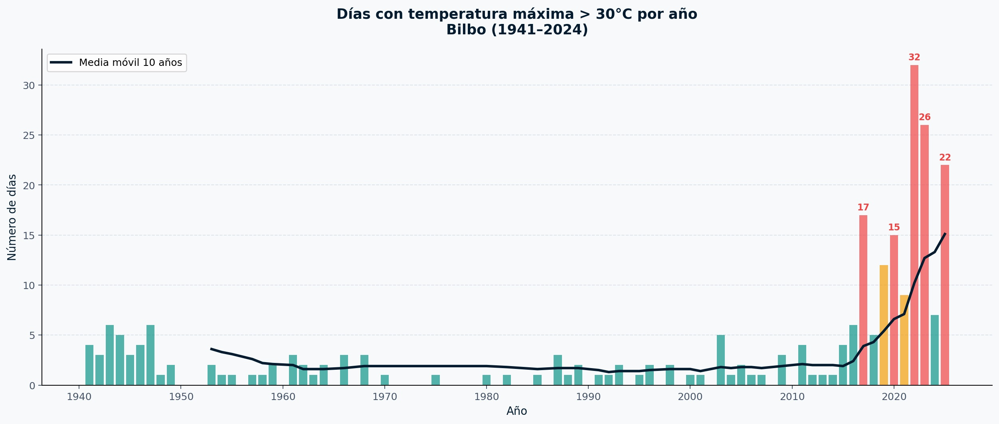

*Días con temperatura máxima > 30 °C — Bilbo (1941–2024)*

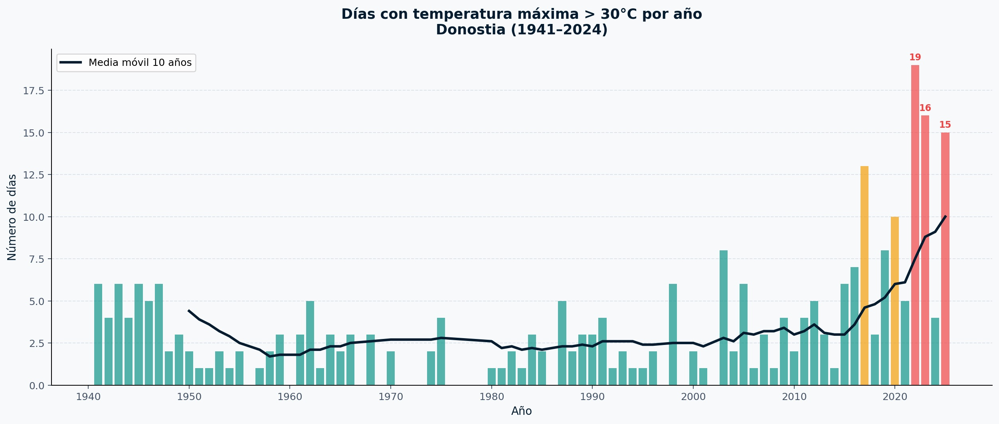

*Días con temperatura máxima > 30 °C — Donostia (1941–2024)*

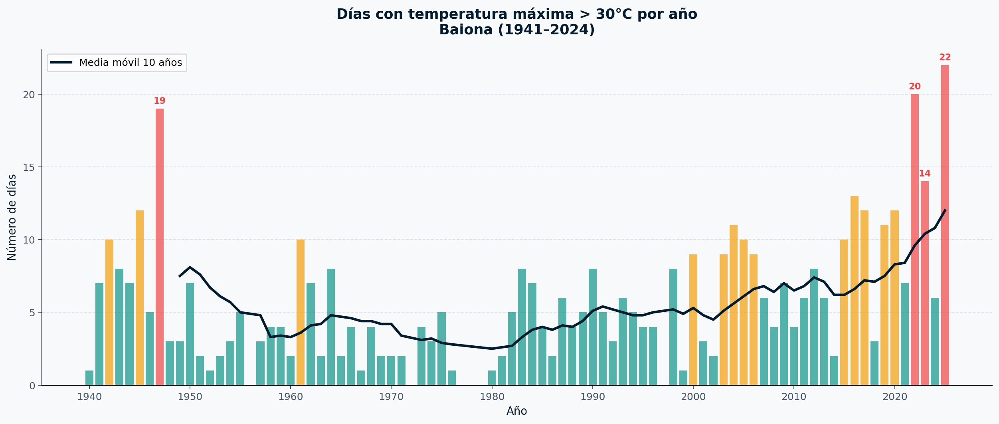

*Días con temperatura máxima > 30 °C — Baiona (1941–2024)*

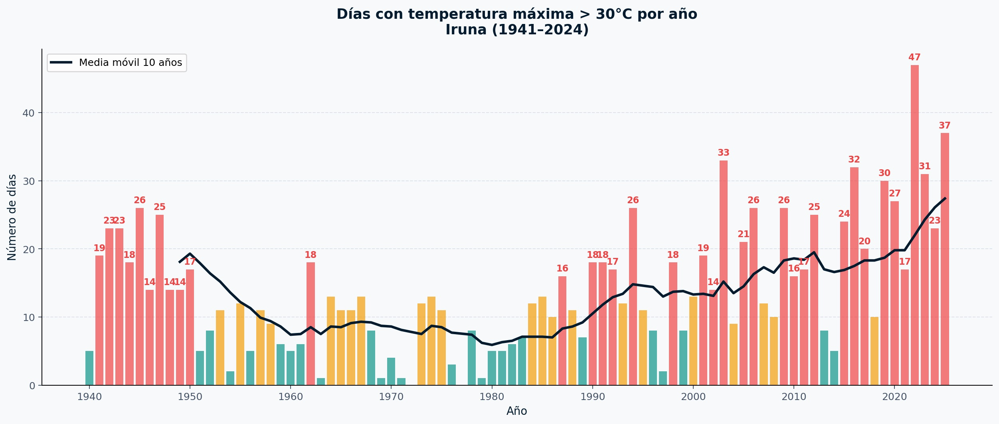

*Días con temperatura máxima > 30 °C — Iruñea (1941–2024)*

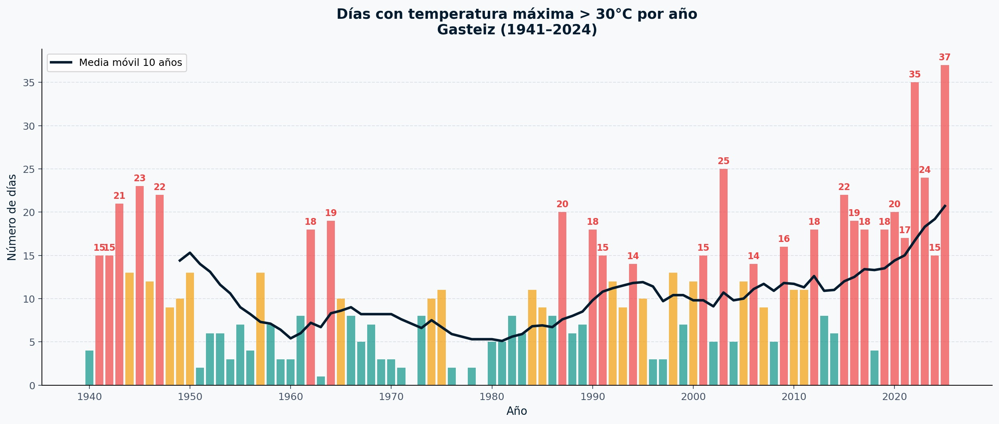

*Días con temperatura máxima > 30 °C — Gasteiz (1941–2024)*

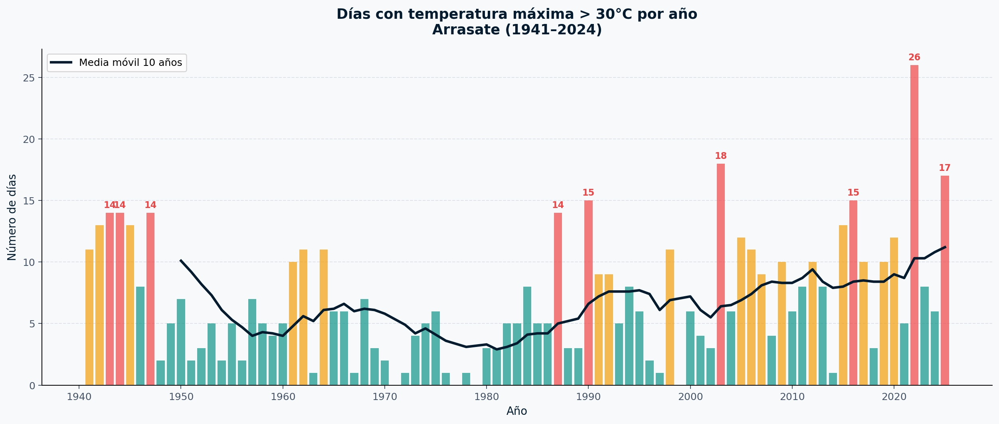

*Días con temperatura máxima > 30 °C — Arrasate (1941–2024)*

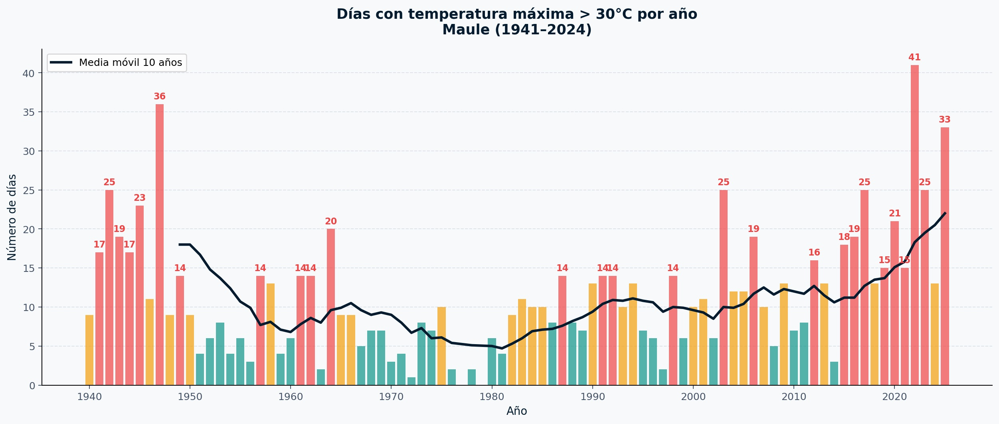

*Días con temperatura máxima > 30 °C — Maule (1941–2024)*

#### Conclusión H1

✅ **H1 se confirma.** La tendencia al alza en el número de días cálidos es consistente en todas las ciudades. El punto de inflexión más visible se sitúa en torno a **1980–1990**, a partir del cual la media móvil muestra una aceleración sostenida. Las ciudades del interior (Iruñea, Gasteiz, Maule) presentan los valores absolutos más altos, mientras que las costeras (Donostia, Bilbo) muestran el cambio más brusco en términos relativos, pasando de frecuencias casi nulas a registros récord en la última década.

### H2 — Reducción de precipitaciones y aumento de episodios intensos

**Hipótesis:** La precipitación acumulada anual muestra una tendencia decreciente, especialmente en los meses de verano, mientras los episodios de lluvia intensa aumentan en frecuencia.

#### Metodología

El análisis se estructura en dos partes:
- **Precipitación total anual:** precipitación acumulada por año con media móvil de 10 años. Las barras azules indican años húmedos (por encima de la media) y las rosas años secos.
- **Días con precipitación intensa (> 30 mm/día):** número de días anuales con precipitación diaria superior a 30 mm, con media móvil de 10 años y código de color por intensidad.

#### Precipitación total anual

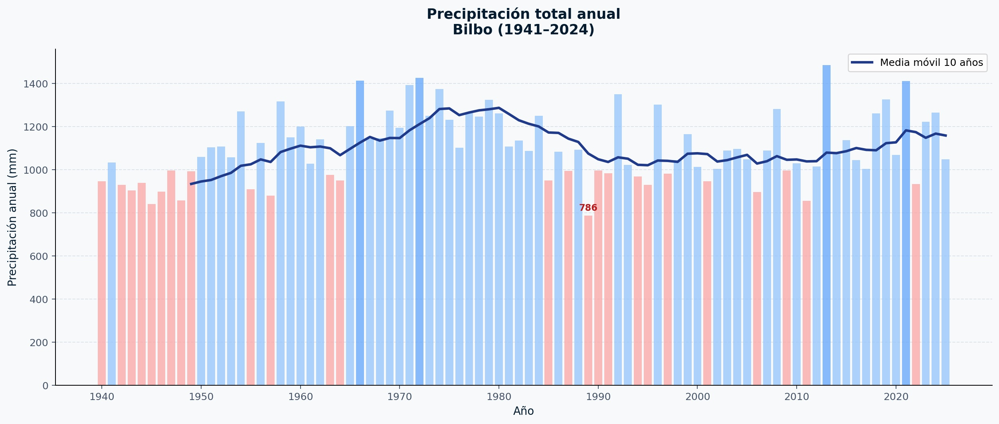

*Precipitación total anual — Bilbo (1941–2024)*

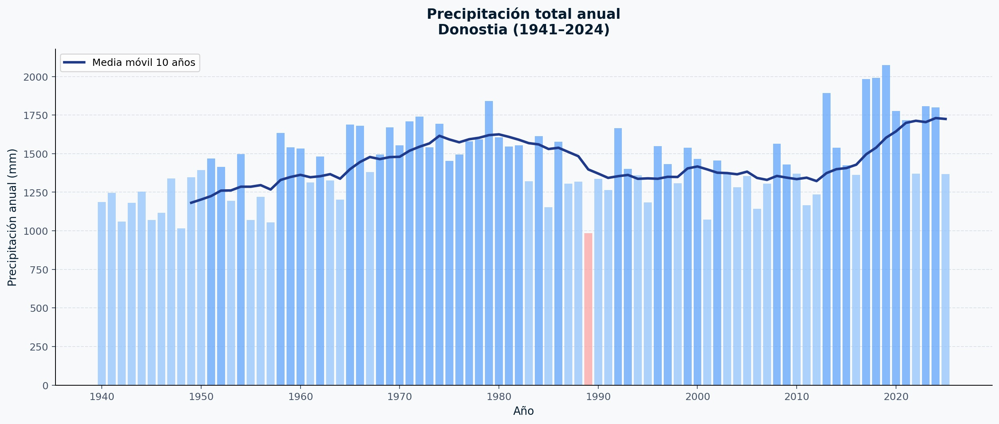

*Precipitación total anual — Donostia (1941–2024)*

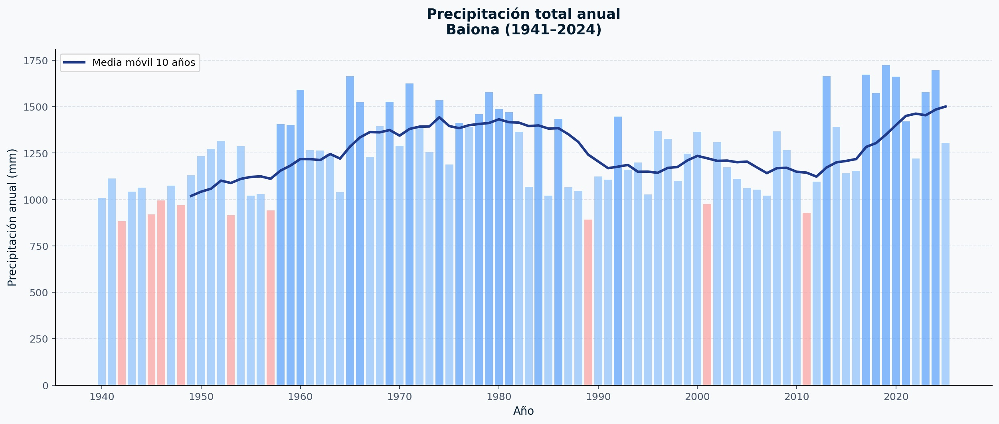

*Precipitación total anual — Baiona (1941–2024)*

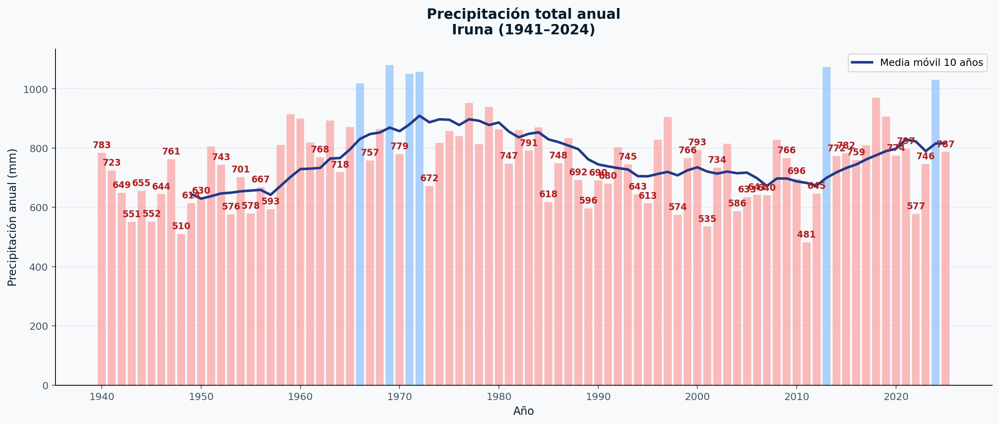

*Precipitación total anual — Iruñea (1941–2024)*

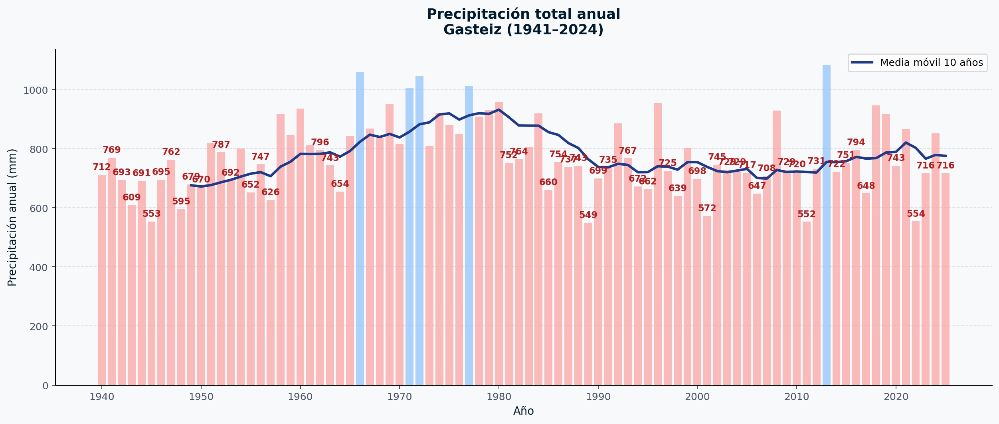

*Precipitación total anual — Gasteiz (1941–2024)*

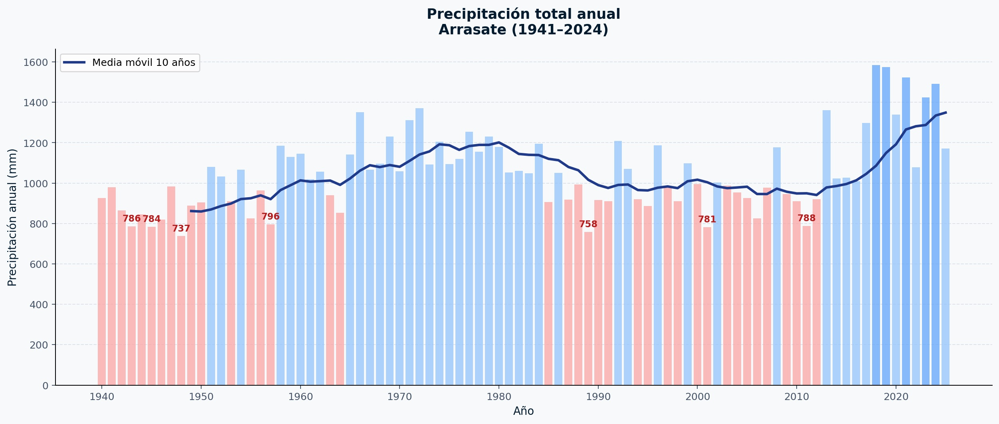

*Precipitación total anual — Arrasate (1941–2024)*

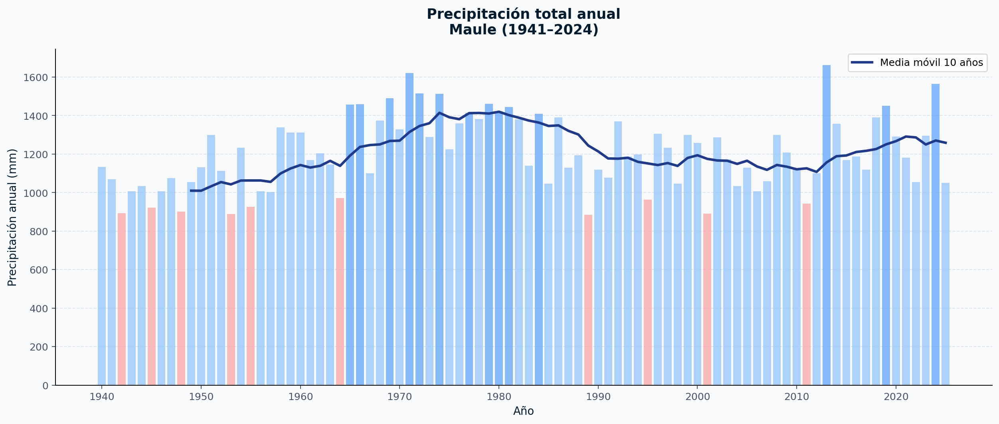

*Precipitación total anual — Maule (1941–2024)*

#### Días con precipitación intensa (> 30 mm/día)

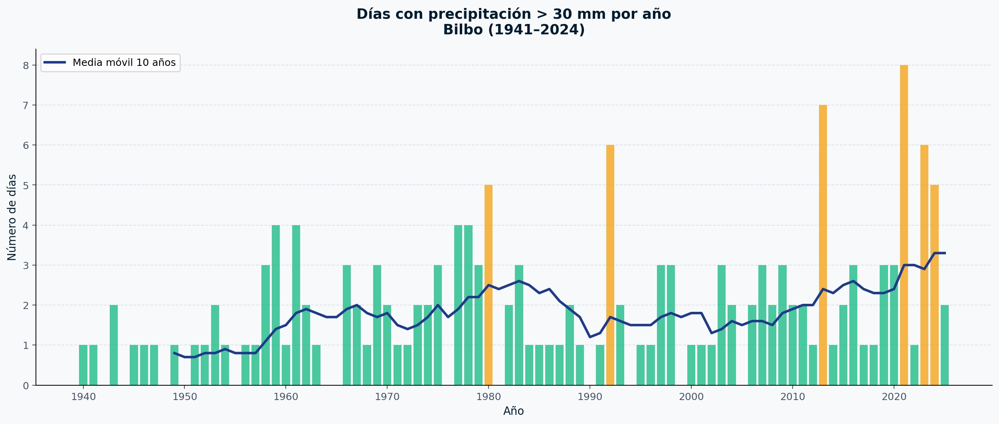

*Días con precipitación > 30 mm — Bilbo (1941–2024)*

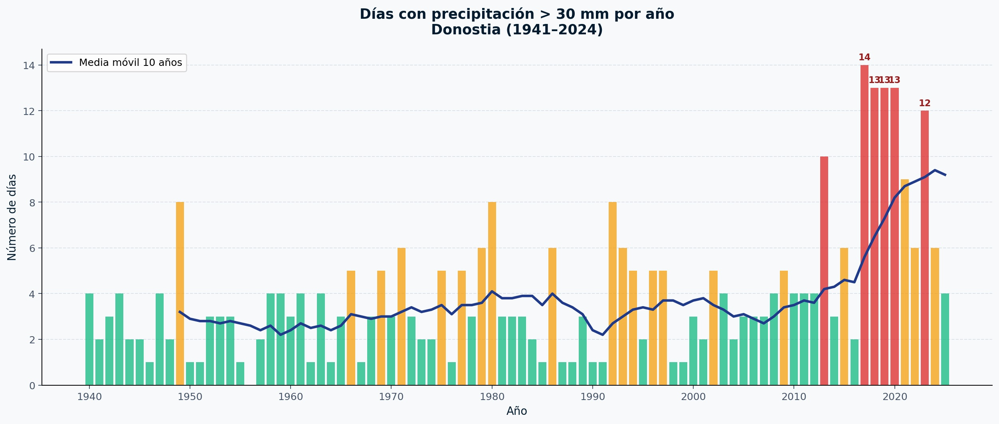

*Días con precipitación > 30 mm — Donostia (1941–2024)*

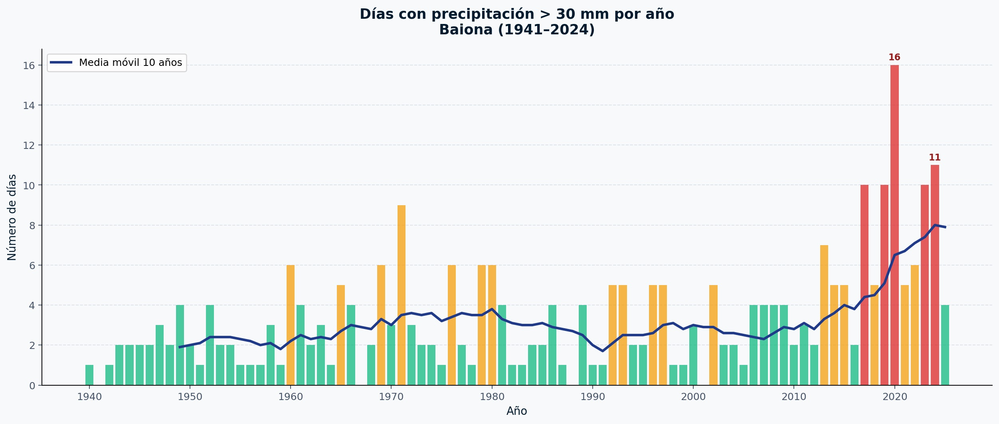

*Días con precipitación > 30 mm — Baiona (1941–2024)*

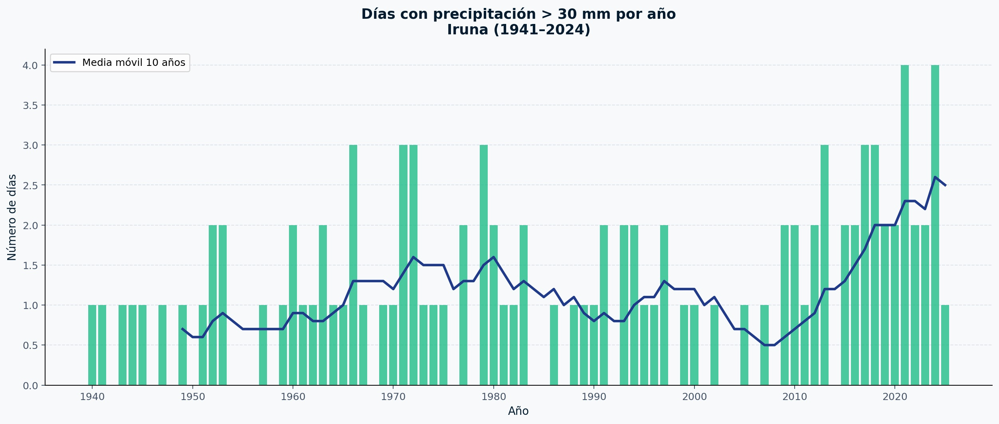

*Días con precipitación > 30 mm — Iruñea (1941–2024)*

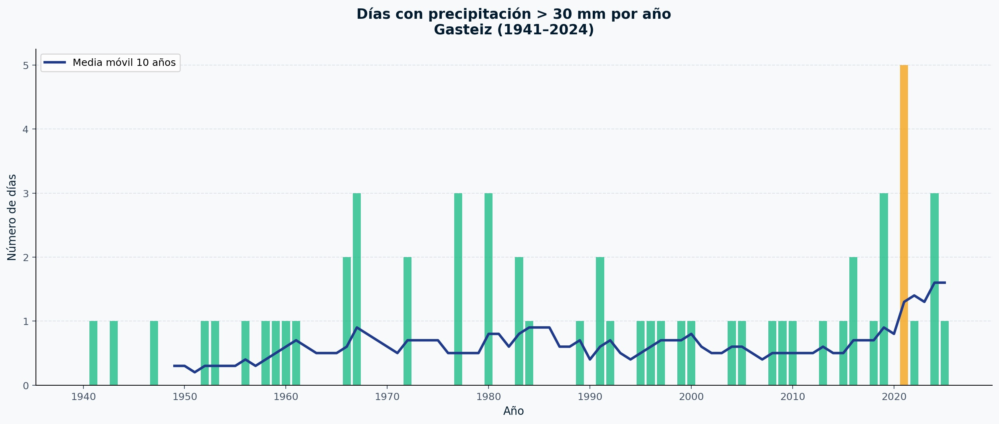

*Días con precipitación > 30 mm — Gasteiz (1941–2024)*

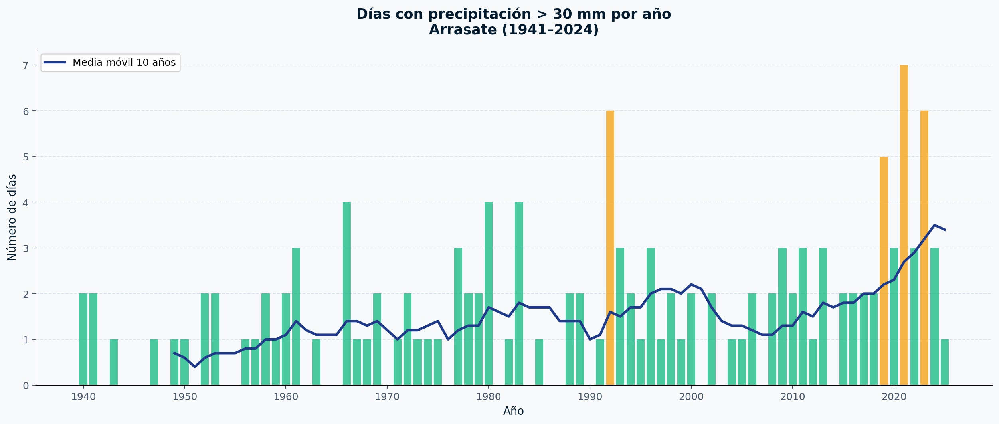

*Días con precipitación > 30 mm — Arrasate (1941–2024)*

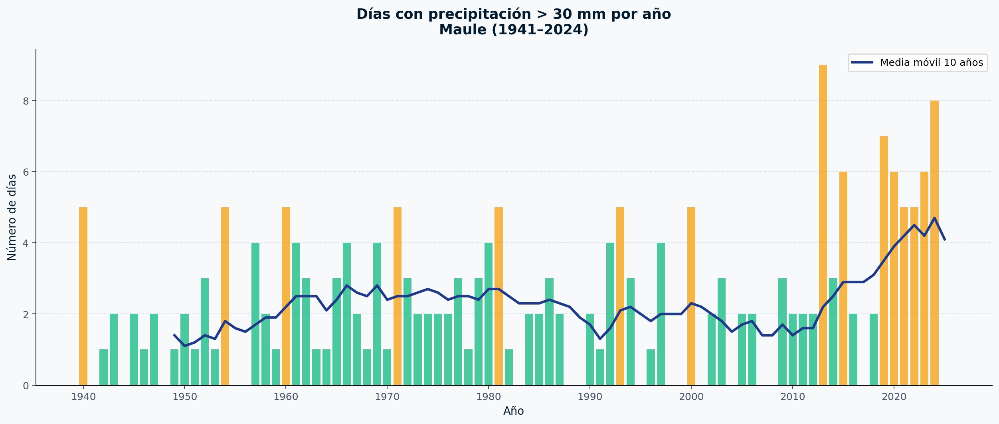

*Días con precipitación > 30 mm — Maule (1941–2024)*

#### Conclusión H2

⚠️ **H2 se confirma parcialmente.** La tendencia a la reducción de la precipitación total es clara en las ciudades del interior (Iruñea, Gasteiz), donde la media móvil muestra un descenso desde los máximos de los años 70–80. Sin embargo, las ciudades costeras (Donostia, Baiona) no muestran una reducción evidente e incluso apuntan a un ligero repunte reciente.

El fenómeno más destacado es la **paradoja precipitación-intensidad**: aunque el total anual se mantiene o reduce, los episodios de lluvia intensa (> 30 mm/día) han aumentado notablemente en los últimos años en todas las ciudades, especialmente en Donostia y Baiona, donde los registros recientes son los más altos de toda la serie. Esto sugiere una concentración de la lluvia en menos días pero de mayor intensidad.

### H3 — Diferencias climáticas entre ciudades

**Hipótesis:** Las ciudades del interior presentan mayor variabilidad térmica anual y un calentamiento relativo más intenso que las costeras.

#### Metodología

Se calculó la **temperatura media anual** para cada ciudad agrupando los datos diarios por año, representando las series temporales en un único gráfico comparativo con un color identificativo fijo por ciudad.

| Ciudad | Color |
|---|---|
| Donostia | Azul cielo |
| Bilbao | Verde esmeralda |
| Baiona | Índigo |
| Iruñea | Ámbar |
| Gasteiz | Rojo |
| Arrasate | Violeta |
| Maule | Rosa |

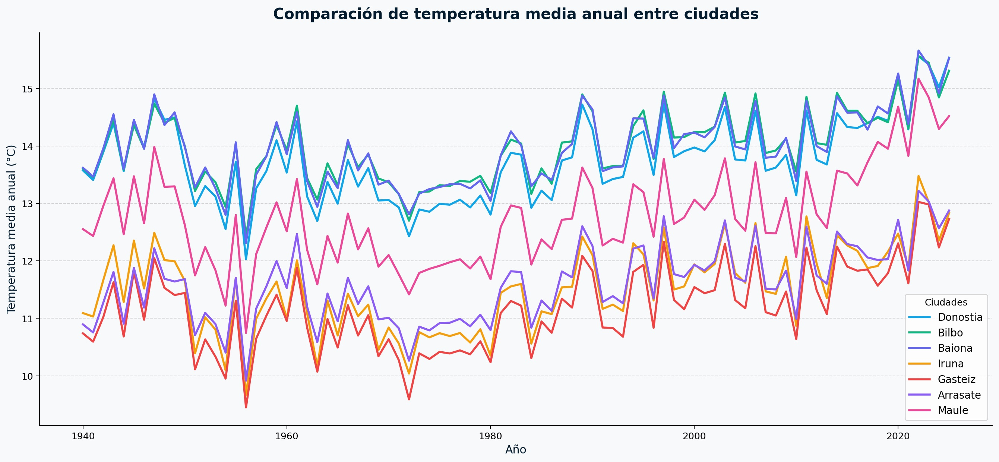

*Comparación de temperatura media anual entre ciudades (1940–2024)*

#### Conclusión H3

✅ **H3 se confirma.** El gráfico muestra claramente dos grupos diferenciados: las ciudades costeras (Donostia, Bilbo, Baiona) se agrupan en la franja superior con temperaturas medias más altas y menor variabilidad interanual, gracias a la influencia termorreguladora del mar. Las ciudades del interior (Gasteiz, Iruñea, Arrasate) se sitúan en la franja inferior con temperaturas más bajas y mayor oscilación entre años. En todos los casos se aprecia una tendencia al alza desde los años 80, siendo la pendiente de calentamiento similar o ligeramente más pronunciada en las ciudades interiores.

### H4 — Mayor frecuencia de temperaturas extremas

**Hipótesis:** El número de días con temperatura máxima > 35 °C ha aumentado notablemente desde los años 2000.

#### Metodología

Para cada ciudad se filtran los días con `temperature_2m_max > 35 °C` y se agrupan por año. Los años sin ningún día extremo se rellenan con 0 para mantener el eje temporal continuo. Se aplica una **media móvil de 10 años** y se anotan los años con ≥ 8 días extremos.

Código de colores:
- 🟡 Ámbar (`1–3 días`): episodio leve
- 🔴 Rojo (`4–7 días`): episodio moderado
- 🟤 Granate (`≥ 8 días`): episodio severo

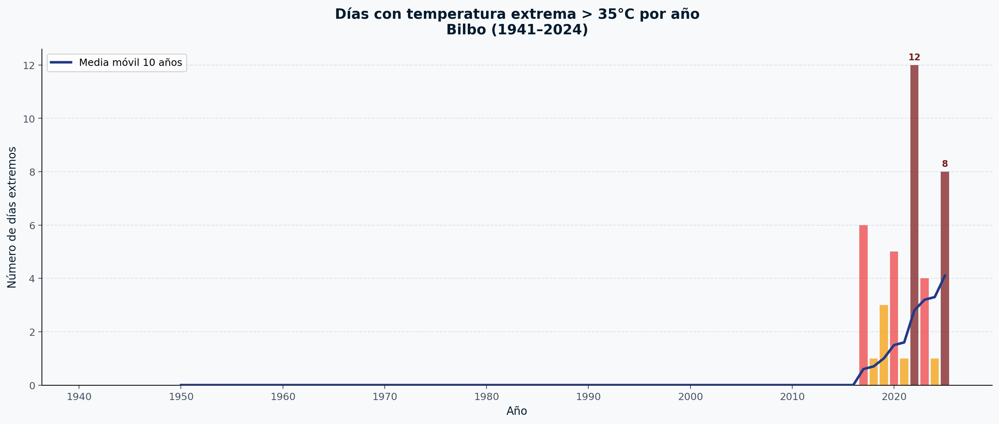

*Días con temperatura extrema > 35 °C — Bilbo (1941–2024)*

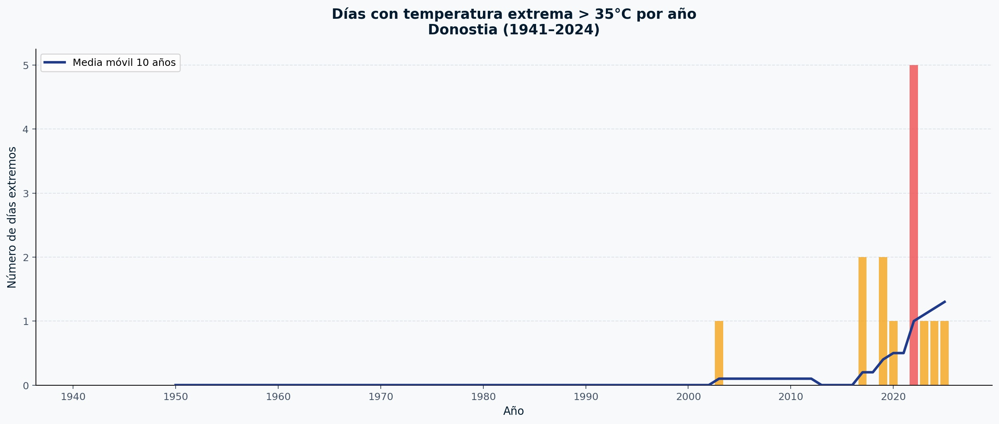

*Días con temperatura extrema > 35 °C — Donostia (1941–2024)*

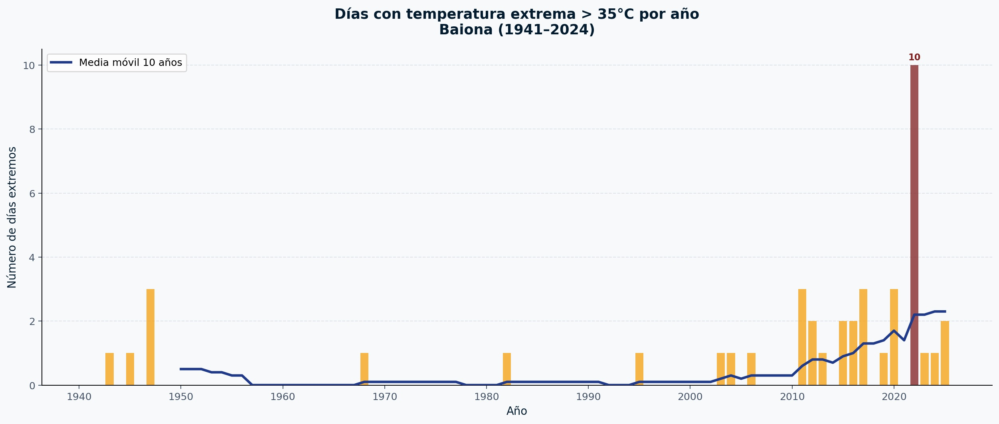

*Días con temperatura extrema > 35 °C — Baiona (1941–2024)*

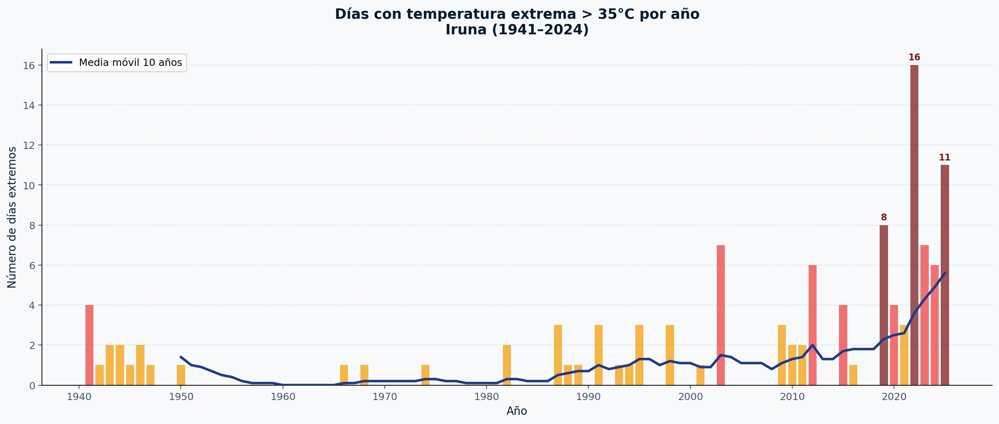

*Días con temperatura extrema > 35 °C — Iruñea (1941–2024)*

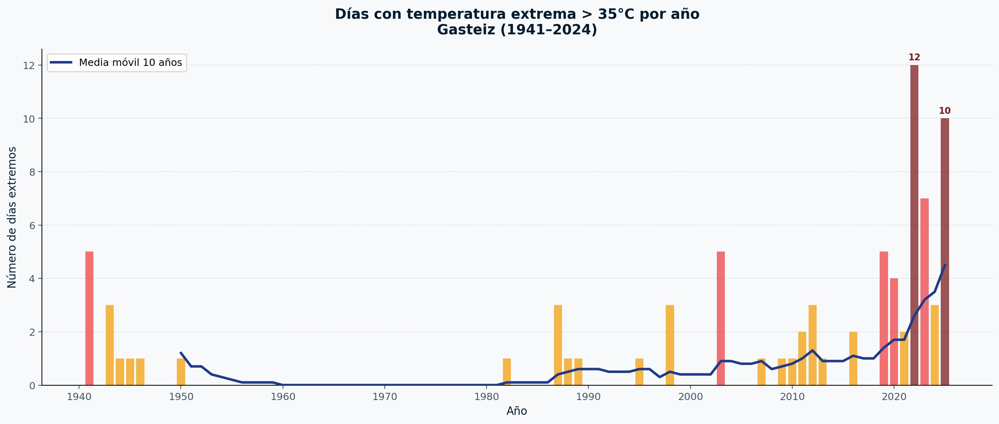

*Días con temperatura extrema > 35 °C — Gasteiz (1941–2024)*

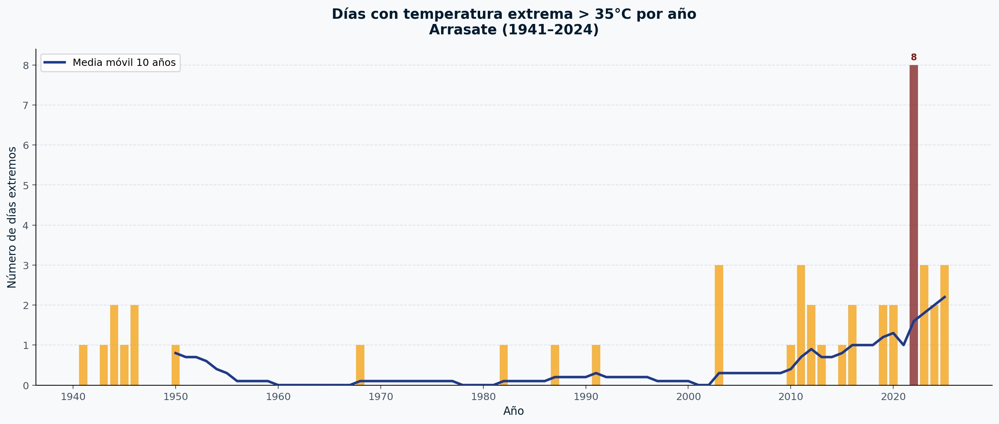

*Días con temperatura extrema > 35 °C — Arrasate (1941–2024)*

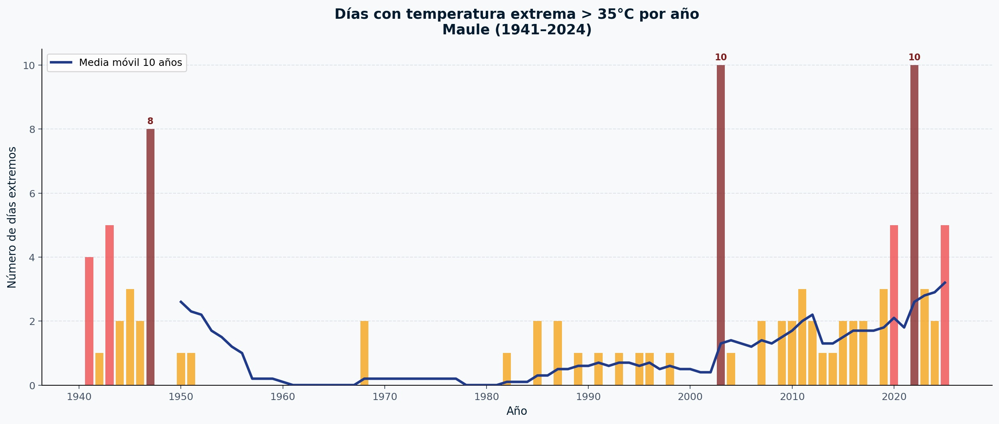

*Días con temperatura extrema > 35 °C — Maule (1941–2024)*

#### Conclusión H4

✅ **H4 se confirma.** Los episodios con más de 8 días extremos (> 35 °C) se concentran prácticamente en los últimos 25 años. Antes de 1990, estos eventos eran excepcionales o inexistentes en la mayoría de ciudades. La media móvil confirma una tendencia al alza que se acelera a partir de los años 2000.

Las ciudades del interior muestran los valores más altos: Iruñea alcanza **16 días** en su peor año reciente, mientras que ciudades costeras como Donostia presentan cifras mucho menores (máximo 5 días), evidenciando el papel protector del mar ante las olas de calor extremo.

### H5 — Estacionalidad más marcada

**Hipótesis:** Los veranos se han vuelto más cálidos y los inviernos más suaves, incrementando la amplitud térmica estacional a lo largo del período.

#### Metodología

El análisis se divide en dos partes:

**Parte 1 — Perfil estacional por quinquenios:** Para cada ciudad se calcula la temperatura media mensual agrupada en períodos de 5 años (1950–2024), representados con un gradiente de color `turbo` donde los tonos fríos corresponden a períodos más antiguos y los cálidos a los más recientes.

**Parte 2 — Amplitud térmica (Julio – Enero):** Se cuantifica la diferencia entre la temperatura media de julio y enero para cada quinquenio, comparando las ciudades en un gráfico de líneas.

#### Perfil estacional por ciudad

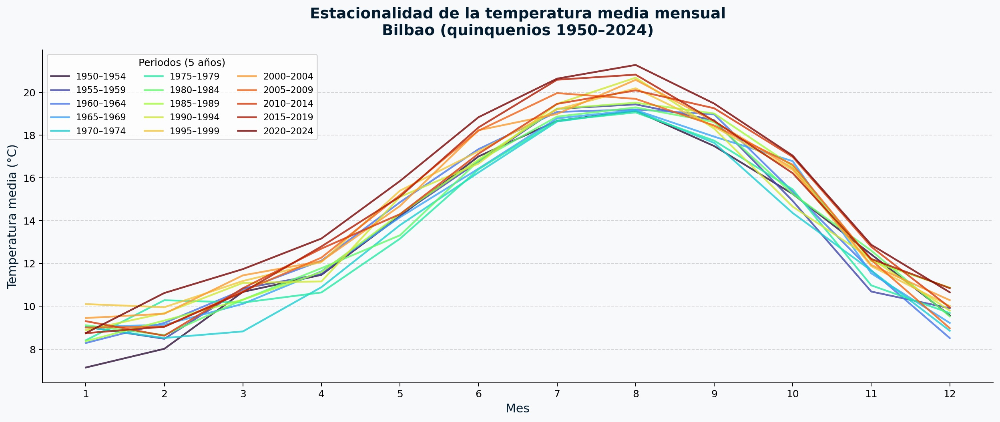

*Estacionalidad de temperatura media mensual — Bilbao (quinquenios 1950–2024)*

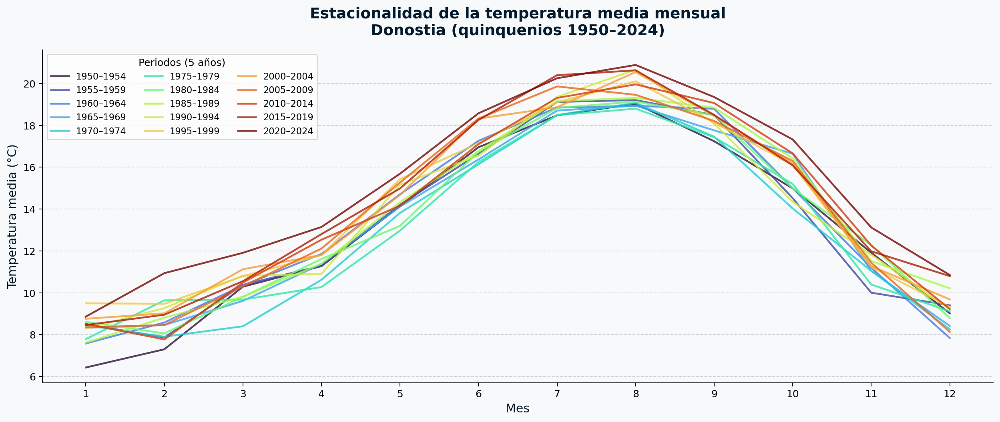

*Estacionalidad de temperatura media mensual — Donostia (quinquenios 1950–2024)*

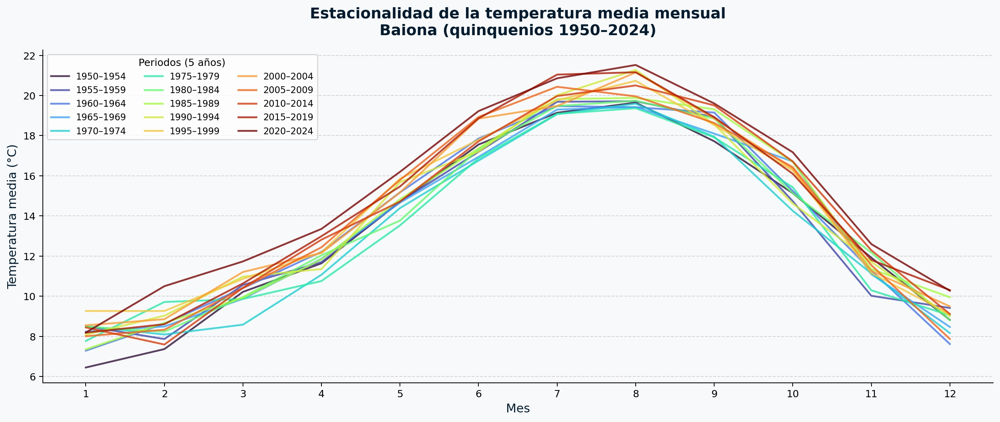

*Estacionalidad de temperatura media mensual — Baiona (quinquenios 1950–2024)*

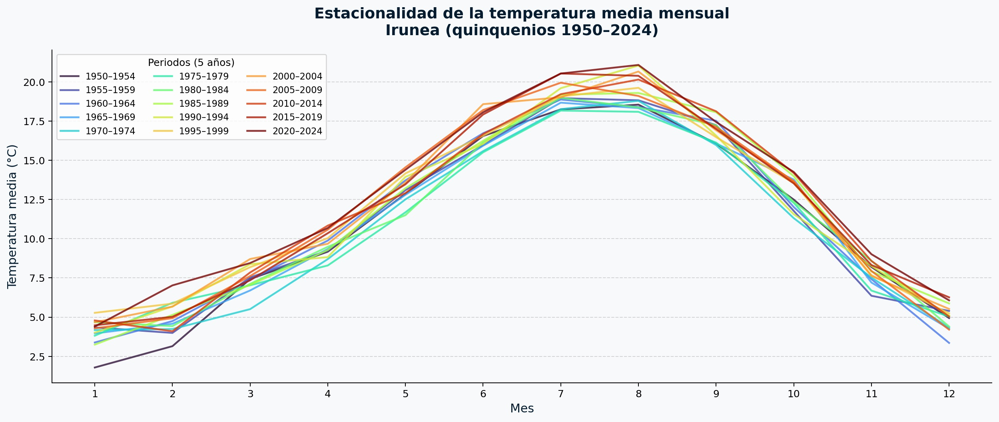

*Estacionalidad de temperatura media mensual — Iruñea (quinquenios 1950–2024)*

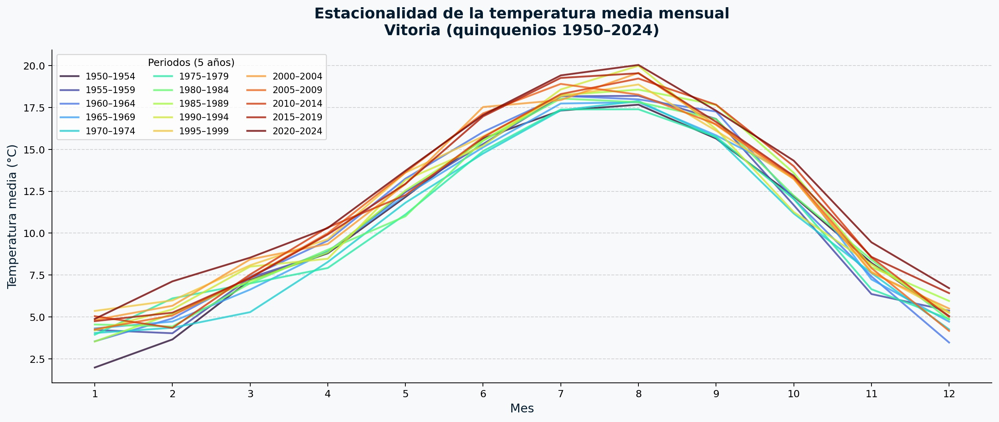

*Estacionalidad de temperatura media mensual — Vitoria (quinquenios 1950–2024)*

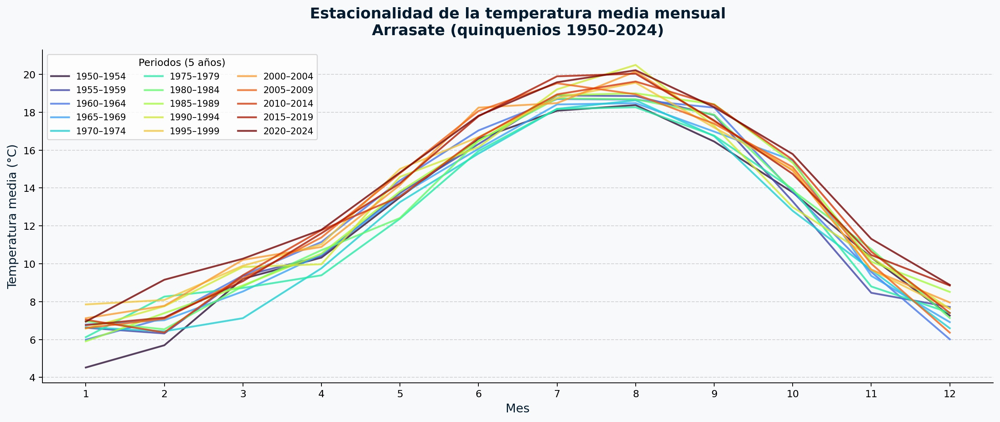

*Estacionalidad de temperatura media mensual — Arrasate (quinquenios 1950–2024)*

#### Comparativa de amplitud térmica estacional entre ciudades

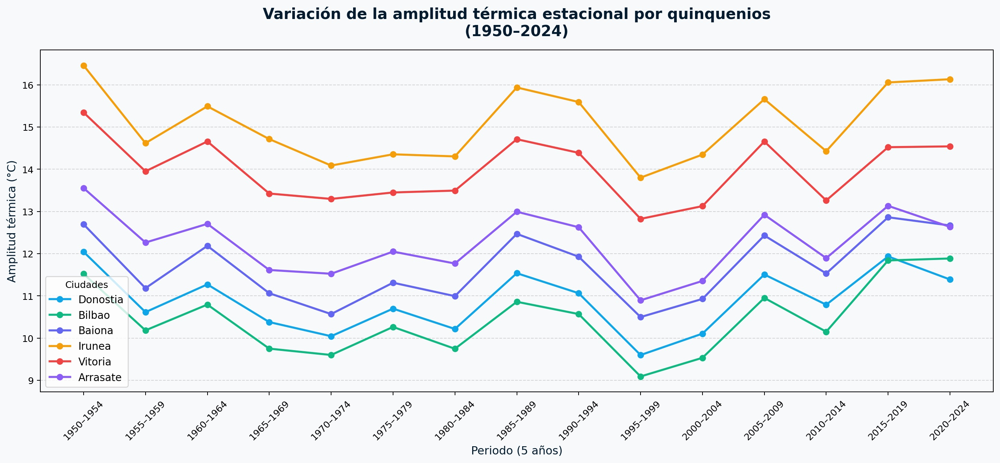

*Variación de la amplitud térmica estacional por quinquenios (1950–2024)*

#### Conclusión H5

✅ **H5 se confirma parcialmente.** En los gráficos por quinquenios se observa claramente que las curvas más recientes (tonos rojos y marrones) se desplazan hacia arriba respecto a las más antiguas (tonos azules y verdes), especialmente en los meses de verano (junio–septiembre). El efecto es más pronunciado en Vitoria e Iruñea que en las ciudades costeras.

En cuanto a la amplitud térmica (julio–enero), el gráfico comparativo muestra que Iruñea mantiene consistentemente la mayor amplitud (~16 °C), seguida de Gasteiz, mientras que las ciudades costeras se sitúan en valores más bajos (~11–12 °C). La tendencia en los últimos quinquenios apunta a una ligera estabilización o incluso reducción de la amplitud en algunas ciudades, lo que sugiere que el calentamiento invernal está compensando parcialmente el estival.

## 5. Conclusiones globales

El análisis exploratorio de 85 años de datos meteorológicos en las principales ciudades de Euskal Herria permite extraer las siguientes conclusiones:

### Señal de calentamiento clara y consistente

Las siete ciudades muestran una tendencia al alza en las temperaturas y en la frecuencia de días cálidos extremos, coherente con los patrones de cambio climático documentados para el sur de Europa. El punto de inflexión más visible se sitúa en torno a **1980–1990**, a partir del cual la aceleración del calentamiento es más pronunciada.

### Diferencias geográficas notables

Las ciudades costeras (Bilbo, Donostia, Baiona) están parcialmente protegidas por la influencia termorreguladora del mar, presentando temperaturas medias más altas pero menor variabilidad extrema. Por el contrario, las ciudades del interior (Gasteiz, Iruñea, Arrasate, Maule) muestran mayor amplitud térmica y un mayor número de días con temperaturas extremas.

### Aumento de extremos térmicos

Los episodios de calor extremo (> 35 °C) son un fenómeno creciente que apenas existía antes de 1990 y se ha consolidado como una característica recurrente del verano vasco en el siglo XXI, con especial intensidad en el interior.

### Paradoja precipitación-intensidad

Aunque la precipitación total anual tiende a reducirse en las ciudades interiores, los episodios de lluvia intensa (> 30 mm/día) han aumentado en todas las ciudades, especialmente en la última década. Este fenómeno refleja una concentración de la precipitación en eventos más cortos e intensos, con implicaciones importantes para la gestión de inundaciones y recursos hídricos.

### Tabla resumen de hipótesis

| Hipótesis | Resultado | Observación clave |
|---|---|---|
| H1 — Aumento de temperaturas | ✅ Confirmada | Aceleración clara desde 1980, máximos históricos en 2020–2024 |
| H2 — Reducción de precipitaciones | ⚠️ Parcial | Interior: reducción total; todas: aumento de episodios intensos |
| H3 — Diferencias entre ciudades | ✅ Confirmada | Costeras más cálidas y estables; interiores con mayor variabilidad |
| H4 — Mayor frecuencia de extremos | ✅ Confirmada | Iruñea: 16 días > 35 °C en año récord; Donostia: máximo 5 días |
| H5 — Estacionalidad más marcada | ⚠️ Parcial | Veranos más calurosos confirmados; amplitud total estabilizada |

## 6. Bibliografía y fuentes

- **Open-Meteo API** — API pública de datos meteorológicos históricos y de previsión.
  https://open-meteo.com

- **ERA5 Reanalysis Dataset** — Hersbach, H. et al. (2020). *The ERA5 global reanalysis*. Quarterly Journal of the Royal Meteorological Society, 146(730), 1999–2049.
  https://doi.org/10.1002/qj.3803

- **ECMWF (European Centre for Medium-Range Weather Forecasts)**
  https://www.ecmwf.int

- **Gobierno Vasco — Impactos esperados del cambio climático en Euskadi**
  https://www.euskadi.eus/expected-impacts-of-climate-change-in-the-basque-country/web01-ejeduki/en/

- **Köppen-Geiger Climate Classification** — Beck, H.E. et al. (2018). *Present and future Köppen-Geiger climate classification maps at 1-km resolution*. Scientific Data, 5, 180214.

- **Pandas Documentation** — https://pandas.pydata.org/docs/
- **Matplotlib Documentation** — https://matplotlib.org/stable/contents.html
- **NumPy Documentation** — https://numpy.org/doc/